In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
from google.colab import drive
import zipfile
import os

# Mount Google Drive
drive.mount('/content/drive')

# Path to the zip file in your Google Drive
zip_file_path = '/content/drive/MyDrive/plant JU/archive (2).zip'
#zip_file_path = '/content/drive/MyDrive/Colab Notebooks/archive (2).zip'
# Directory where you want to extract the zip file
extract_to_dir = '/content/extracted'

# Create the directory if it doesn't exist
os.makedirs(extract_to_dir, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_dir)

print("Zip file extracted successfully!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Zip file extracted successfully!


# orginal Images

Displaying 3 images from class: Anthracnose


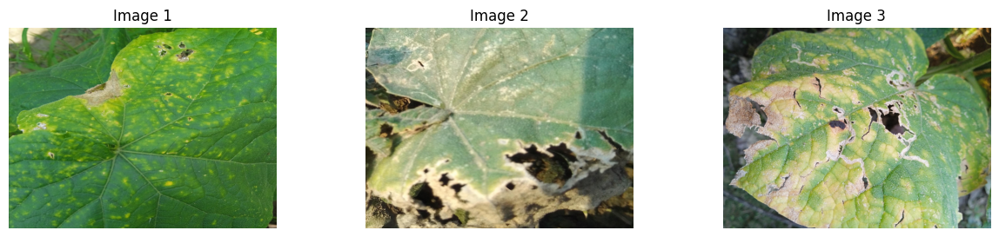

Displaying 3 images from class: Bacterial Wilt


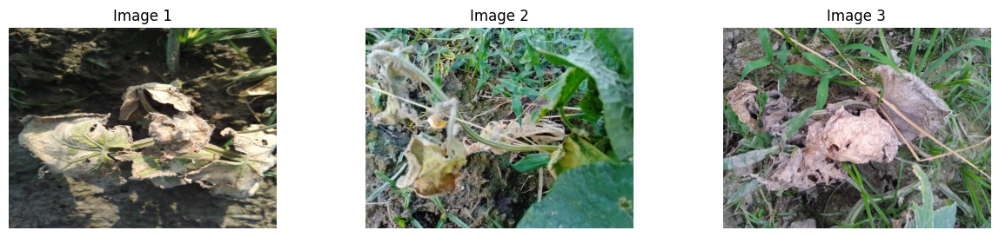

Displaying 3 images from class: Belly Rot


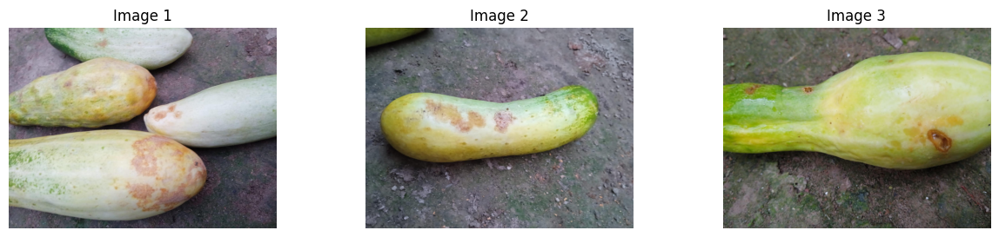

Displaying 3 images from class: Downy Mildew


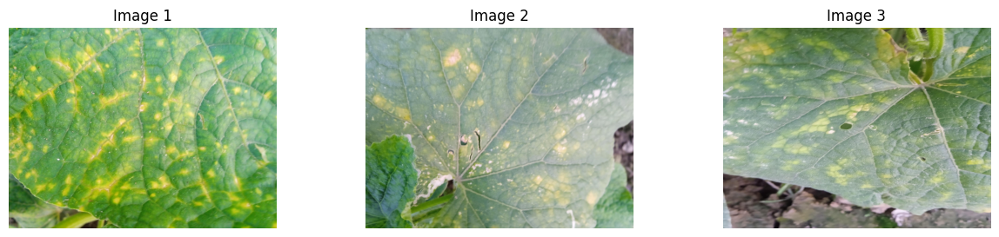

Displaying 3 images from class: Fresh Cucumber


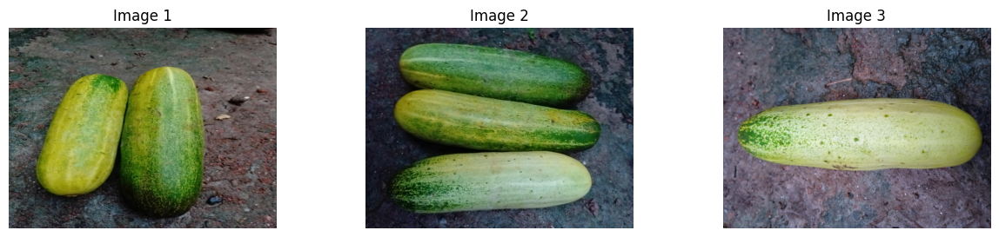

Displaying 3 images from class: Fresh Leaf


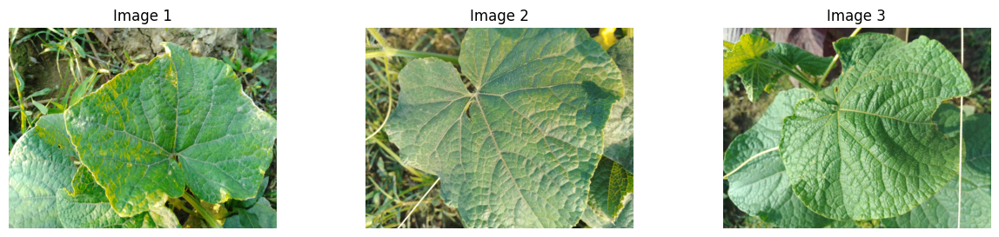

Displaying 3 images from class: Gummy Stem Blight


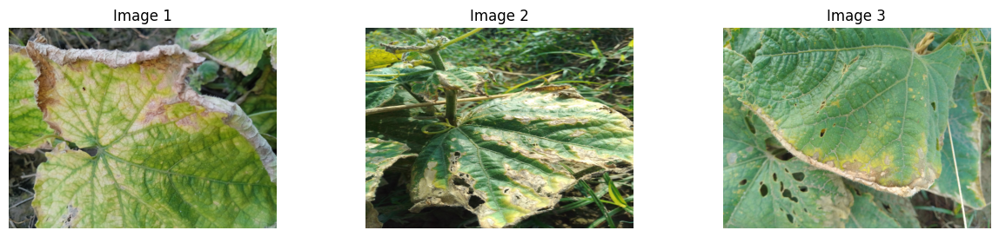

Displaying 3 images from class: Pythium Fruit Rot


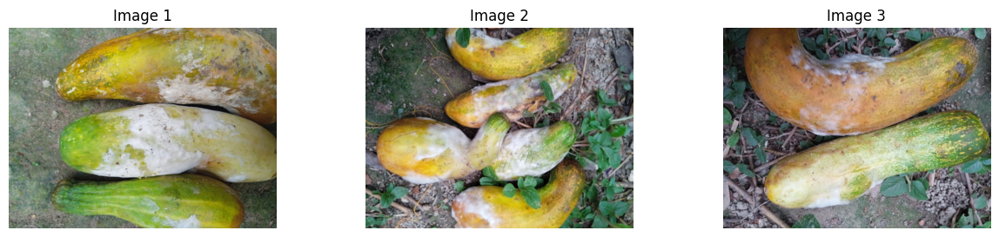

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing the dataset
dataset_dir = '/content/extracted/Cucumber Disease Recognition Dataset/Original Image/Original Image'

# List of classes
classes = ["Anthracnose", "Bacterial Wilt", "Belly Rot", "Downy Mildew",
           "Fresh Cucumber", "Fresh Leaf", "Gummy Stem Blight", "Pythium Fruit Rot"]

# Function to display images from each class
def display_images_per_class(dataset_dir, classes, num_images=3):
    for class_name in classes:
        class_dir = os.path.join(dataset_dir, class_name)
        images = os.listdir(class_dir)
        images = random.sample(images, min(num_images, len(images)))
        print(f"Displaying {num_images} images from class: {class_name}")
        plt.figure(figsize=(15, 3))
        for i, image_name in enumerate(images):
            image_path = os.path.join(class_dir, image_name)
            image = Image.open(image_path)
            plt.subplot(1, num_images, i+1)
            plt.imshow(image)
            plt.title(f"Image {i+1}")
            plt.axis('off')
        plt.show()

# Display images from each class
display_images_per_class(dataset_dir, classes, num_images=3)


#Augmented Images

Displaying 3 images from class: Anthracnose


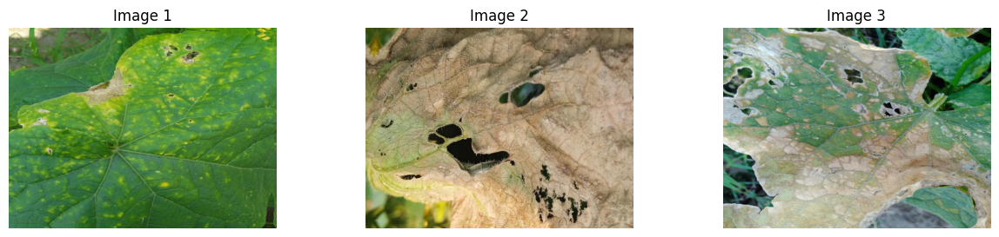

Displaying 3 images from class: Bacterial Wilt


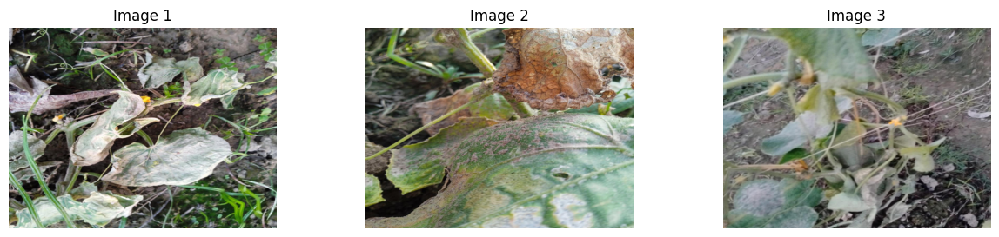

Displaying 3 images from class: Belly Rot


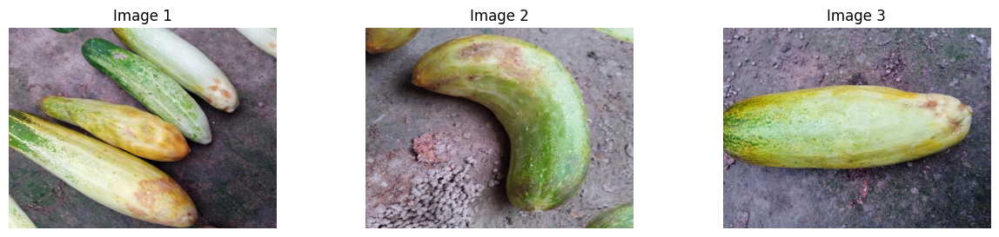

Displaying 3 images from class: Downy Mildew


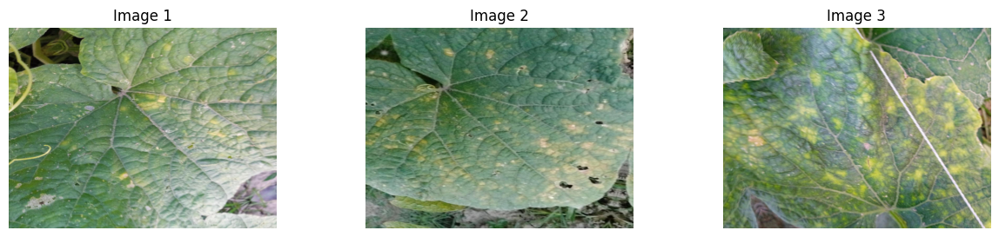

Displaying 3 images from class: Fresh Cucumber


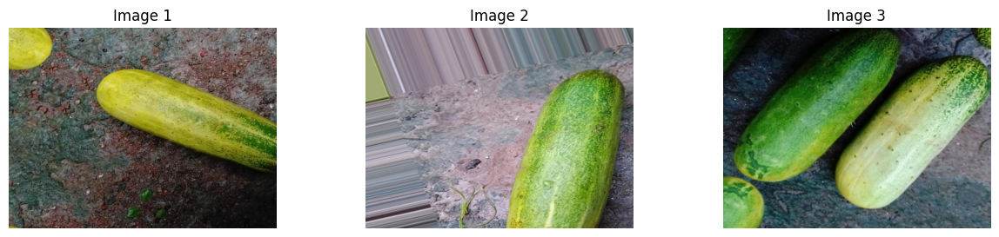

Displaying 3 images from class: Fresh Leaf


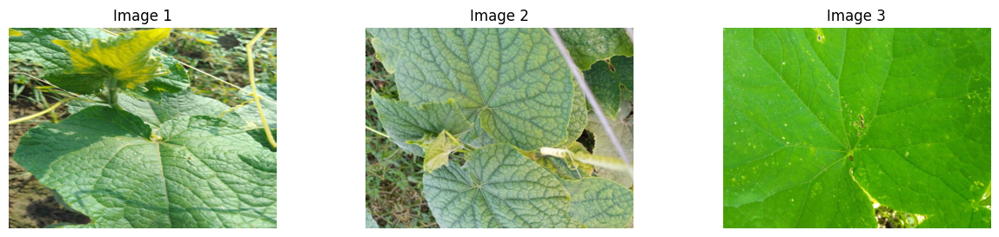

Displaying 3 images from class: Gummy Stem Blight


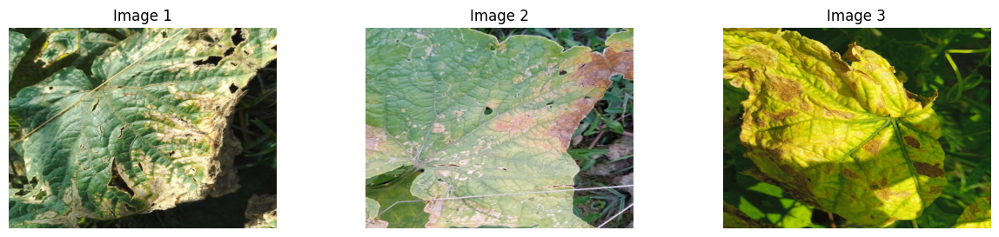

Displaying 3 images from class: Pythium Fruit Rot


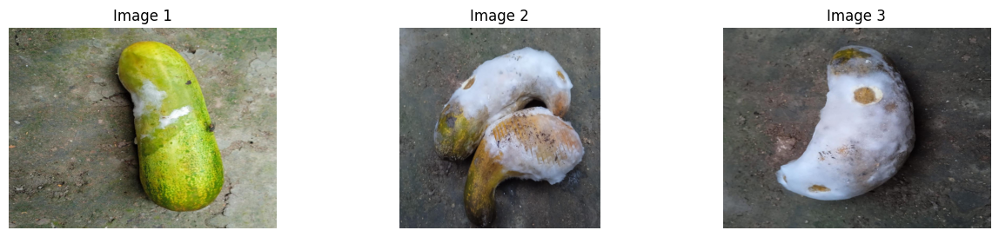

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing the dataset
dataset_dir = '/content/extracted/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image'

# List of classes
classes = ["Anthracnose", "Bacterial Wilt", "Belly Rot", "Downy Mildew",
           "Fresh Cucumber", "Fresh Leaf", "Gummy Stem Blight", "Pythium Fruit Rot"]

# Function to display images from each class
def display_images_per_class(dataset_dir, classes, num_images=3):
    for class_name in classes:
        class_dir = os.path.join(dataset_dir, class_name)
        images = os.listdir(class_dir)
        images = random.sample(images, min(num_images, len(images)))
        print(f"Displaying {num_images} images from class: {class_name}")
        plt.figure(figsize=(15, 3))
        for i, image_name in enumerate(images):
            image_path = os.path.join(class_dir, image_name)
            image = Image.open(image_path)
            plt.subplot(1, num_images, i+1)
            plt.imshow(image)
            plt.title(f"Image {i+1}")
            plt.axis('off')
        plt.show()

# Display images from each class
display_images_per_class(dataset_dir, classes, num_images=3)


#Library import here

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from keras.models import Model,Sequential
from keras.layers import Conv2D, GlobalAveragePooling2D, Dropout, Flatten, Dense, Activation,GlobalMaxPooling2D
from tensorflow.keras.applications.inception_v3 import InceptionV3
from sklearn.metrics import confusion_matrix,classification_report
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense




## Define dataset directory and parameters

In [ ]:

dataset_dir = '/content/extracted/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image'
batch_size = 32
image_shape = (224, 224)  # Specify the size of your input images

# Data augmentation and preprocessing

In [ ]:

train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Splitting the data into training and validation sets
)

#Data Generator for Spilting

In [ ]:
train_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=image_shape,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Training set
)

validation_generator = train_datagen.flow_from_directory(
    dataset_dir,
    target_size=image_shape,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Validation set
)

Found 5120 images belonging to 8 classes.
Found 1280 images belonging to 8 classes.


#Apply here Customized CNN Model

In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape = (240,240,3)))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Conv2D(128, kernel_size=(3,3), activation='relu'))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))

model.add(tf.keras.layers.Dense(8, activation='softmax'))
model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 119, 119, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 119, 119, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 58, 58, 64)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 58, 58, 64)        0

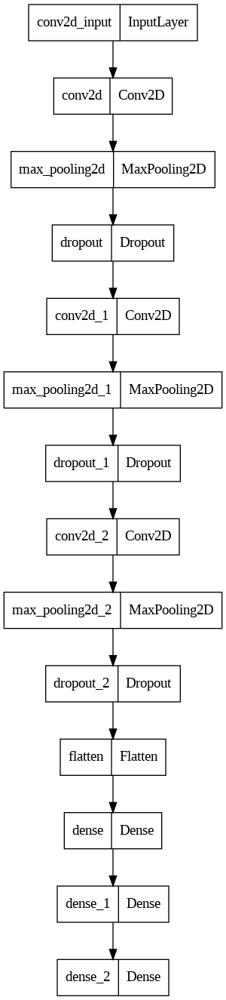

In [ ]:
tf.keras.utils.plot_model(model)

In [ ]:
history = model.fit_generator(generator=train_dataset, steps_per_epoch=len(train_dataset), epochs=15, validation_data=val_dataset, validation_steps=len(val_dataset))

<ipython-input-22-80a22f47c22e>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=train_dataset, steps_per_epoch=len(train_dataset), epochs=15, validation_data=val_dataset, validation_steps=len(val_dataset))


Epoch 1/15
307/307 [==============================] - 71s 188ms/step - loss: 0.7413 - accuracy: 0.7273 - val_loss: 0.4505 - val_accuracy: 0.8612
Epoch 2/15
307/307 [==============================] - 55s 178ms/step - loss: 0.2876 - accuracy: 0.8921 - val_loss: 0.2332 - val_accuracy: 0.9283
Epoch 3/15
307/307 [==============================] - 59s 193ms/step - loss: 0.1952 - accuracy: 0.9282 - val_loss: 0.1537 - val_accuracy: 0.9605
Epoch 4/15
307/307 [==============================] - 54s 176ms/step - loss: 0.1450 - accuracy: 0.9474 - val_loss: 0.1099 - val_accuracy: 0.9660
Epoch 5/15
307/307 [==============================] - 53s 172ms/step - loss: 0.1160 - accuracy: 0.9568 - val_loss: 0.1339 - val_accuracy: 0.9467
Epoch 6/15
307/307 [==============================] - 53s 171ms/step - loss: 0.0867 - accuracy: 0.9692 - val_loss: 0.1184 - val_accuracy: 0.9550
Epoch 7/15
307/307 [==============================] - 54s 175ms/step - loss: 0.0728 - accuracy: 0.9744 - val_loss: 0.0783 - val_ac

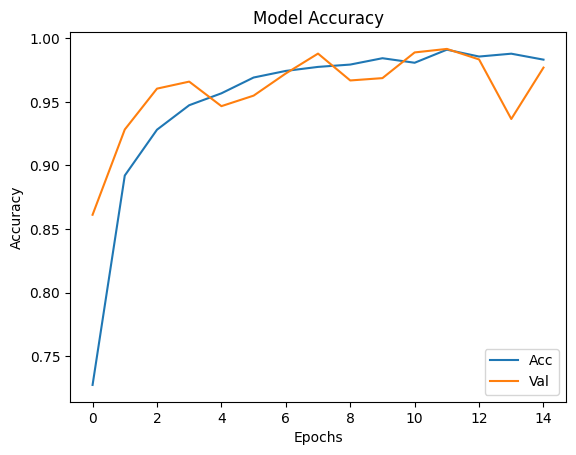

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'lower right')

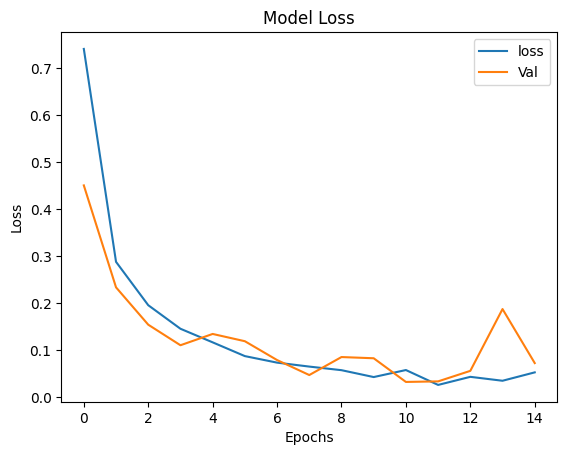

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper right')

#Apply Here Vgg16 Model

#Import Library

In [ ]:

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array,load_img
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D

from sklearn.metrics import confusion_matrix,classification_report

#Create Model archetecture

In [ ]:
def create_model(input_shape, n_classes, optimizer='rmsprop', fine_tune=0):


    conv_base = VGG16(include_top=False, weights='imagenet', input_shape=input_shape)


    if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
    else:
        for layer in conv_base.layers:
            layer.trainable = False


    top_model = conv_base.output


    top_model = GlobalAveragePooling2D()(top_model)


    output_layer = Dense(n_classes, activation='softmax')(top_model)


    model = Model(inputs=conv_base.input, outputs=output_layer)


    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

input_shape = (224, 224, 3)
n_classes=8


vgg_model = create_model(input_shape, n_classes, fine_tune=0)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

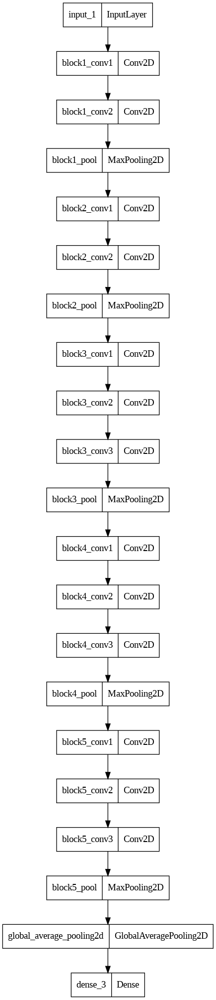

In [ ]:
tf.keras.utils.plot_model(vgg_model)

In [ ]:
checkpoint_filepath = 'vgg16_model_best_weights.h5'

checkpoint = ModelCheckpoint(filepath=checkpoint_filepath,save_weights_only=True,monitor='val_accuracy',mode='max',save_best_only=True,verbose=1)



vgg_history = vgg_model.fit(train_dataset,validation_data=val_dataset,
          steps_per_epoch=train_dataset.samples/train_dataset.batch_size,
          validation_steps=val_dataset.samples/val_dataset.batch_size,
          epochs=20,callbacks=[checkpoint])

Epoch 1/20
307/306 [==============================] - ETA: 0s - loss: 1.1783 - accuracy: 0.6603
Epoch 1: val_accuracy improved from -inf to 0.83180, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 69s 203ms/step - loss: 1.1783 - accuracy: 0.6603 - val_loss: 0.7650 - val_accuracy: 0.8318
Epoch 2/20
307/306 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.8484
Epoch 2: val_accuracy improved from 0.83180 to 0.87776, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 59s 192ms/step - loss: 0.6654 - accuracy: 0.8484 - val_loss: 0.5177 - val_accuracy: 0.8778
Epoch 3/20
307/306 [==============================] - ETA: 0s - loss: 0.4937 - accuracy: 0.8832
Epoch 3: val_accuracy improved from 0.87776 to 0.90717, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 60s 194ms/step - loss: 0.4937 - accuracy: 0.8832 - val_loss: 0.4068 - val_accuracy: 0.9072
Epoch 4/20
30

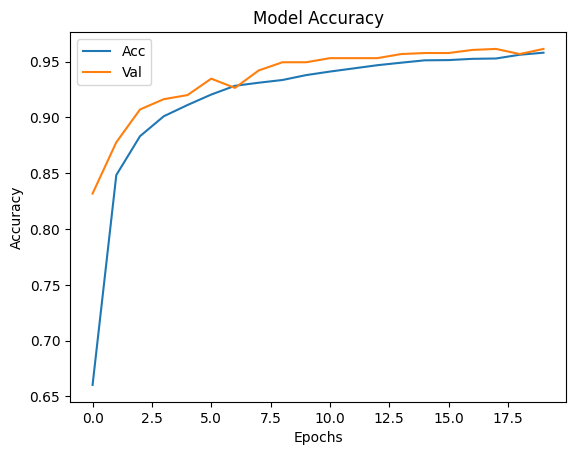

In [ ]:
plt.plot(vgg_history.history['accuracy'])
plt.plot(vgg_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

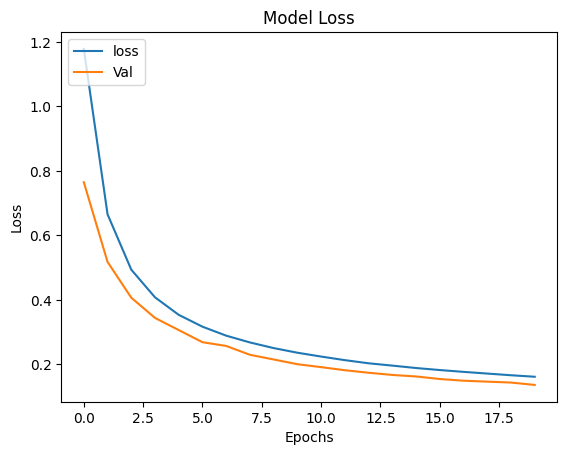

In [ ]:
plt.plot(vgg_history.history['loss'])
plt.plot(vgg_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

# Resnet 50

#Import Library

In [ ]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.layers import Input
from tensorflow.keras.optimizers import Adam

#Create Model Archetecture

In [ ]:
baseModel = ResNet50V2(weights="imagenet",include_top=False, input_tensor=Input(shape=(150,150,3)))

headModel=baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(6, activation="softmax")(headModel)

model = Model(inputs=baseModel.input,outputs=headModel)

for layer in baseModel.layers: layer.trainable=False

94668760/94668760 [==============================] - 1s 0us/step


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 156, 156, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 75, 75, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 77, 77, 64)           0         ['conv1_conv[0][0]']          
                                                                                            

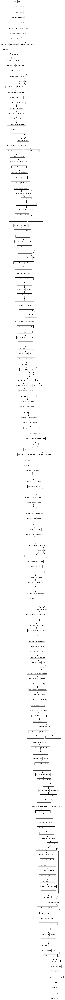

In [ ]:
tf.keras.utils.plot_model(model)

In [ ]:
model.compile(
    loss='binary_crossentropy',
    optimizer = Adam(learning_rate=3e-4),
    metrics=["accuracy"]
)

In [ ]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    steps_per_epoch = len(train_generator)//15,
    validation_steps=len(validation_generator)//15,
    epochs=50,
    verbose=1
)

Epoch 1/50
48/48 [==============================] - 15s 197ms/step - loss: 0.6558 - accuracy: 0.3444 - val_loss: 0.2843 - val_accuracy: 0.6722
Epoch 2/50
48/48 [==============================] - 10s 210ms/step - loss: 0.3663 - accuracy: 0.5861 - val_loss: 0.2165 - val_accuracy: 0.7778
Epoch 3/50
48/48 [==============================] - 8s 157ms/step - loss: 0.2885 - accuracy: 0.6931 - val_loss: 0.1423 - val_accuracy: 0.8889
Epoch 4/50
48/48 [==============================] - 8s 173ms/step - loss: 0.2397 - accuracy: 0.7569 - val_loss: 0.1167 - val_accuracy: 0.9056
Epoch 5/50
48/48 [==============================] - 11s 227ms/step - loss: 0.2179 - accuracy: 0.7889 - val_loss: 0.0933 - val_accuracy: 0.9389
Epoch 6/50
48/48 [==============================] - 8s 157ms/step - loss: 0.2035 - accuracy: 0.8083 - val_loss: 0.0800 - val_accuracy: 0.9556
Epoch 7/50
48/48 [==============================] - 10s 197ms/step - loss: 0.1829 - accuracy: 0.8347 - val_loss: 0.0730 - val_accuracy: 0.9444
Ep

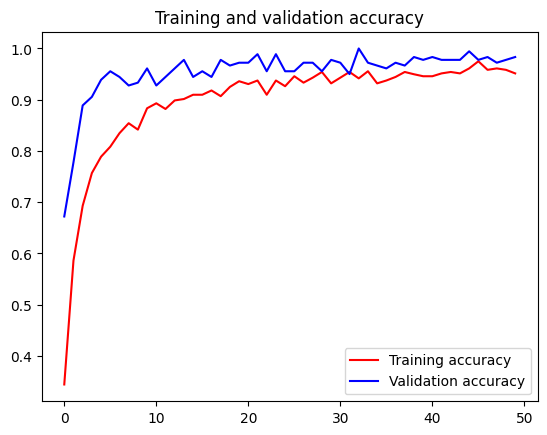

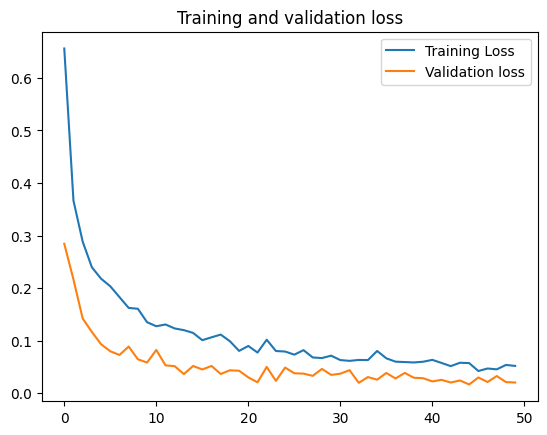

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.plot(epochs,acc,'r', label='Training accuracy')
plt.plot(epochs,val_acc,'b', label='Validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs,loss,label='Training Loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)

#Inception v3

#create Inception Model

In [ ]:

inception = InceptionV3(weights='imagenet',input_shape=(224, 224, 3),include_top=False)

inception.summary()

layers = inception.layers
print(f'Number of Layers: {len(layers)}')

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_97 (Conv2D)          (None, 111, 111, 32)         864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 111, 111, 32)         96        ['conv2d_97[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 111, 111, 32)         0         ['batch_normalizati

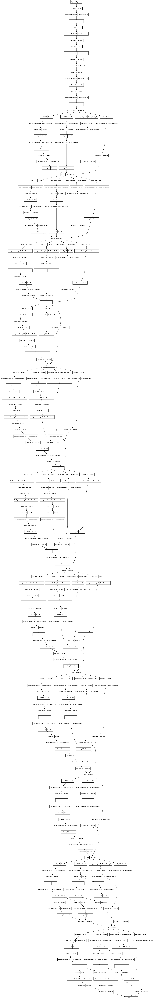

In [ ]:
tf.keras.utils.plot_model(inception)

In [ ]:
TRAIN_SIZE = train_generator.samples
TEST_SIZE = validation_generator.samples
LEARNING_RATE = 0.001
BATCH_SIZE = 32

callbacks = EarlyStopping(patience = 3, monitor='val_acc')


inputs = inception.input

x = inception.output
x = GlobalAveragePooling2D()(x)

x = Dense(512, activation='relu')(x)

x = Dropout(0.5)(x)

outputs = Dense(8, activation ='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)


for layer in layers:
    layer.trainable = False


model.compile(optimizer=Adam(lr=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:


# train the model for 10 epochs
history = model.fit_generator(
                train_generator,
                epochs= 10,
                validation_data = validation_generator,
                validation_steps = TEST_SIZE//BATCH_SIZE,
                steps_per_epoch = TRAIN_SIZE//BATCH_SIZE,
                callbacks = [callbacks])

<ipython-input-84-31efbf9011fc>:30: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
340/340 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.9038

340/340 [==============================] - 208s 580ms/step - loss: 0.2757 - accuracy: 0.9038 - val_loss: 0.0955 - val_accuracy: 0.9650
Epoch 2/10
340/340 [==============================] - ETA: 0s - loss: 0.1498 - accuracy: 0.9465

340/340 [==============================] - 193s 566ms/step - loss: 0.1498 - accuracy: 0.9465 - val_loss: 0.0770 - val_accuracy: 0.9743
Epoch 3/10
340/340 [==============================] - ETA: 0s - loss: 0.1171 - accuracy: 0.9556

340/340 [==============================] - 196s 576ms/step - loss: 0.1171 - accuracy: 0.9556 - val_loss: 0.0584 - val_accuracy: 0.9784
Epoch 4/10
340/340 [==============================] - ETA: 0s - loss: 0.1136 - accuracy: 0.9580

340/340 [==============================] - 193s 567ms/step - loss: 0.1136 - accuracy: 0.9580 - val_loss: 0.0740 - val_accuracy: 0.9728
Epoch 5/10
340/340 [==============================] - ETA: 0s - loss: 0.0963 - accuracy: 0.9633

340/340 [==============================] - 190s 557ms/step - loss: 0.0963 - accuracy: 0.9633 - val_loss: 0.0412 - val_accuracy: 0.9859
Epoch 6/10
340/340 [==============================] - ETA: 0s - loss: 0.0921 - accuracy: 0.9655

340/340 [==============================] - 190s 557ms/step - loss: 0.0921 - accuracy: 0.9655 - val_loss: 0.0442 - val_accuracy: 0.9866
Epoch 7/10
340/340 [==============================] - ETA: 0s - loss: 0.0857 - accuracy: 0.9692

340/340 [==============================] - 191s 561ms/step - loss: 0.0857 - accuracy: 0.9692 - val_loss: 0.0355 - val_accuracy: 0.9870
Epoch 8/10
340/340 [==============================] - ETA: 0s - loss: 0.0838 - accuracy: 0.9707

340/340 [==============================] - 191s 563ms/step - loss: 0.0838 - accuracy: 0.9707 - val_loss: 0.0477 - val_accuracy: 0.9814
Epoch 9/10
340/340 [==============================] - ETA: 0s - loss: 0.0697 - accuracy: 0.9746

340/340 [==============================] - 191s 561ms/step - loss: 0.0697 - accuracy: 0.9746 - val_loss: 0.0465 - val_accuracy: 0.9840
Epoch 10/10
340/340 [==============================] - ETA: 0s - loss: 0.0842 - accuracy: 0.9702

340/340 [==============================] - 190s 558ms/step - loss: 0.0842 - accuracy: 0.9702 - val_loss: 0.0387 - val_accuracy: 0.9866


Text(0.5, 0, 'N.of Epochs')

<Figure size 640x480 with 0 Axes>

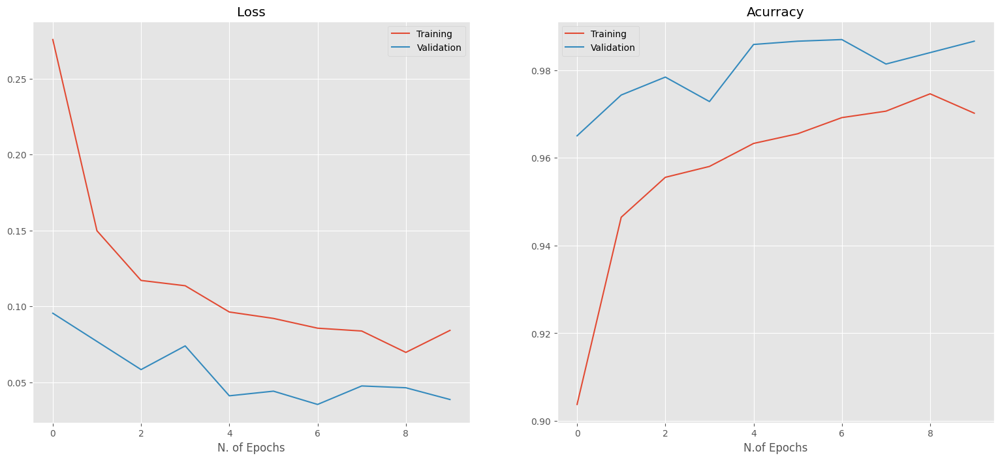

In [ ]:
# Plot training loss vs validation loss
plt.style.use('ggplot')
plt.figure()
fig,(ax1, ax2)=plt.subplots(1,2,figsize=(19,8))
ax1.plot(history.history['loss'])
ax1.plot(history.history['val_loss'])
ax1.legend(['Training','Validation'])
ax1.set_title('Loss')
ax1.set_xlabel('N. of Epochs')
## plot training accuracy vs validation accuracy
ax2.plot(history.history['accuracy'])
ax2.plot(history.history['val_accuracy'])
ax2.legend(['Training','Validation'])
ax2.set_title('Acurracy')
ax2.set_xlabel('N.of Epochs')